# <center> Майнор "Интеллектуальный анализ данных" </center>

# <center> Курс "Введение в анализ данных" </center>

# <center> Лабораторная работа №2. Кластерный анализ. </center>

# Часть 1

В данном задании вам необходимо **самостоятельно** реализовать один из алгоритмов кластеризации.  
По аналогии с классами в scikit-learn, нужно реализовать класс, наследуемый от [Base Estimator](https://scikit-learn.org/stable/modules/generated/sklearn.base.BaseEstimator.html).  
Подробнее про реализацию своих моделей в scikit-learn: [here](https://scikit-learn.org/stable/developers/develop.html#rolling-your-own-estimator).  
В классе помимо `__init__()` нужно реализовать два метода:
 - `fit()` - метод, выполняющий кластеризацию данных.
 - `predict()` - метод, определяющий для нового объекта, к какому из кластеров он относится. 
 
Для удобства можно создавать дополнительные методы класса, которые будут вызываться в `fit()` или `predict()`.  <br>
Функции для вычисления расстояний *между объектами* самим реализовывать не нужно, используйте реализации из `scipy`.

In [1039]:
import random
import pandas as pd
import pylab as pl
import numpy as np
import scipy.spatial as ss
from scipy.spatial import distance
import sklearn.cluster as sc
import sklearn.manifold as sm
import sklearn.datasets as ds
import sklearn.metrics as smt
import seaborn as sns
import matplotlib.pyplot as plt
import math
import warnings
warnings.simplefilter('ignore')
from math import sqrt

# Южаков Максим ИАД - 1 #
# Вариант 2 

In [988]:
import math
from sklearn.base import BaseEstimator, ClusterMixin
from scipy.spatial.distance import pdist

class My_Clust(BaseEstimator, ClusterMixin):

    def __init__(self, eps, min_samples, metric="euclidean",metric_params=None):
        self.eps = float(eps)
        self.min_samples = float(min_samples)
        self.metric = metric
        self.metric_params = metric_params

    def fit(self, X, y=None):
        self.labels = [0] * len(X)
        current_cluster = 0
        # текущий номер кластера

        for current_point in range(0, len(X)):
            if self.labels[current_point] != 0:
                # если точке присвоен кластер, то пропускаем
                continue
            neighbours = self.find_neighbours(X, current_point)

            if len(neighbours) < self.min_samples:
                self.labels[current_point] = -1
                #  если соседей у точки <  min_samples, то относим её к выбросам
            else:
                current_cluster += 1
                # если соседей >= min_samples то создаём кластер 
                self.labels[current_point] = current_cluster
                self.fill_cluster(X, self.labels, neighbours, current_cluster)
                # добавляем в кластер нужные точки
        return self

    def find_neighbours(self, X, current_point):
        neighbours = []
        if self.metric == "matrix":
            dm = self.dim_matrix(X)
            for i in range(len(X)):
                if dm[current_point][i]<self.eps:
                    neighbours.append(i)
        else:
            for potential_neighbour in range(0, len(X)):
                mt = []
                mt.append(X[current_point])
                mt.append(X[potential_neighbour])
                if pdist(mt,self.metric,self.metric_params) < self.eps:  
                    neighbours.append(potential_neighbour)
                # если расстояние < eps то точка является соседом
        return neighbours 

    def fill_cluster(self, X, labels, neighbours, current_cluster):
        i = 0
        while i < len(neighbours):
            cluster_element = neighbours[i]
            # выбираем точку среди соседей 
            if self.labels[cluster_element] == 0:
                self.labels[cluster_element] = current_cluster
                # добавляем в кластер эту точку, которая ещё не была никуда определена
                potential_neighbours = self.find_neighbours(X, cluster_element)  # находим соседей данной точки
                if len(potential_neighbours) >= self.min_samples:
                    neighbours += potential_neighbours
                    # если количество соседей новой точки кластера >= минимального, то эта точка является базовой и её соседи должны попасть в этот же кластер
            elif self.labels[cluster_element] == -1:
                self.labels[cluster_element] = current_cluster
            # если среди соседей точка помечена как выброс, то это пограничная точка кластера
            i += 1
    
    def dim_matrix(self, X):
        DIM = np.zeros((len(X),len(X)))
        #проходим по элементам этой матрицы
        df = pd.DataFrame(X)
        points = [ [list(i)] for i in df.values]
        for i in range(len(X)):
            for j in range(len(X)):
                if i==j:
                #для диагонали введем константное значение 100
                    DIM[i][j]=100
                else:
                #для остальных посчитаем евклидово расстояние
                    min_dist = []
                    for k in points[i]:
                        for s in points[j]:
                            euclide = sqrt(((np.array(k) -np.array(s))**2).sum()) 
                            min_dist.append(euclide)
                    DIM[i][j] = min(min_dist)
        return DIM
    
    def find_pred_neigh(self, X, cur_coord):
        neighbours = []
        for potential_neighbour in range(0, len(X)):
            mt = []
            mt.append(cur_coord)
            mt.append(X[potential_neighbour])
            if pdist(mt,self.metric,self.metric_params) < self.eps:  
                neighbours.append(potential_neighbour)
        return neighbours
    
    
    def predict(self, X, y=[[]]):
        if len(y) >1 :
            pred_labels = []
            for p_y in y:
                #проходим по элементам нового элемента и находим для них расстояния до элементов X в пределе eps 
                ngh = self.find_pred_neigh(X,p_y)
                i=0
                while i < len(ngh):
                    #Тут выделяем основные точки
                    cluster_element = ngh[i]
                    potential_neighbours = self.find_neighbours(X, cluster_element)
                    if len(potential_neighbours) >= self.min_samples:
                        i = i + 1
                        continue
                    else:
                        ngh.remove(cluster_element)
                ngh_labels = []
                for k in ngh:
                    ngh_labels.append(self.labels[k])
                #перебираем лейблы основных точек
                set_ngh = set(ngh_labels)
                most_cmn = 0
                most_qty = 0
                for s in set_ngh:
                    qty = ngh_labels.count(s)
                    if qty > most_qty:
                        most_qty = qty
                        most_cmn = s
                #добавлянм точке самый часто встречающийся лейбл
                if(most_cmn==0):
                    pred_labels.append(-1)
                else:
                    pred_labels.append(most_cmn)
            return pred_labels 
        else:
            return self.labels

Создадим рандомные точки

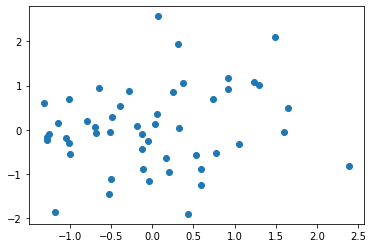

In [941]:
x = np.random.randn(50, 2)
plt.scatter(x[:,0],x[:,1], label='True Position')

In [996]:
k = My_Clust(metric='euclidean', min_samples=5, eps=0.5)
m = k.fit(x)
labels = m.predict(x)

Проверим на них аботу алгоритма

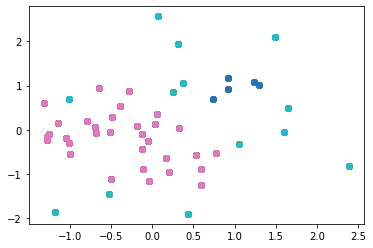

In [997]:
c = np.array(labels)
for k in labels:
    plt.scatter(x[c==k,0], x[c==k,1])
plt.show()

Теперь проверим атрибут predict

Создадим еще несколько точек и посмотрим, к каким кластерам их определит

[[-1.17680334  2.94758746]
 [ 1.32744522 -0.22883636]
 [ 1.3302603   1.14321228]
 [ 0.63638181  0.04140154]
 [-0.68707515 -0.66987513]]


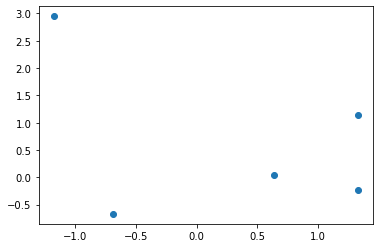

In [1002]:
y = np.random.randn(5, 2)
print(y)
plt.scatter(y[:,0],y[:,1], label='True Position')

In [1003]:
k = My_Clust(metric='euclidean', min_samples=5, eps=0.5)
m = k.fit(x)
m.predict(x,y)

[-1, -1, 2, 1, 1]

### Вариант №1  

Алгоритм агломеративной кластеризации.  
  
Параметры: 
- **metric:** Функция расстояния между объектами. Должны поддерживаться метрики из `scipy.spatial.distance`, самописные функции (callable) и предрассчитанная матрица расстояний.  
- **linkage:** Расстояние между кластерами. Должны поддерживаться Single, Complete и Average.  
- **n_clusters:** Число кластеров. По умолчанию должно быть None. 

  
Атрибуты:  
- **z_:** матрица объединений, аналогичная той, что возвращает `linkage()` из `scipy.cluster.hierarchy`;
- **data_:** копия данных, использованных для кластеризации;  
- **labels_:** метки кластеров для каждого объекта.   
  
Дополнительно нужно реализовать метод `get_labels()` для вычисления **labels_**, он должен быть аналогичен [fcluster()](https://docs.scipy.org/doc/scipy/reference/generated/scipy.cluster.hierarchy.fcluster.html). <br>
В случае, если **n_clusters** не None, то после вычисления матрицы **z_** в методе `fit()` должен быть вызван `get_labels()` с соответствующими параметрами, и вычислены **labels_**. В других случаях метод `fit()` только вычисляет матрицу **z_**, для вычисления **labels_** нужно явно вызывать `get_labels()`. 
  
Метод `predict()`:  Кластер для нового объекта определяется по методу, заданному в **linkage**.  <br>
**Note:** Метод `predict()` не выполняется в случае, когда **metric** - это матрица расстояний.

### Вариант №2

Алгоритм Dbscan.  
  
Параметры: 
- **eps:** радиус окрестности $\varepsilon$;  
- **min_samples:** минимальное число объектов в окрестности $\varepsilon$ для основных точек;  
- **metric:** функция расстояния между объектами. Должны поддерживаться метрики из `scipy.spatial.distance`, самописные функции (callable) и предрассчитанная матрица расстояний.   
- **metric_params:** параметры функции расстояния, если такие есть. 
  
Атрибуты:  
- **core\_sample\_coords\_:** - векторы основных точек;
- **labels_:** метки кластеров для каждого объекта.
  
Метод `predict()`:  Для нового объекта вычисляется число основных точек из каждого кластера, попавших в окрестность $\varepsilon$. Объект определяется в кластер с наибольшим числом таких точек.  
**Note:** Метод `predict()` не выполняется в случае, когда **metric** - это матрица расстояний. 

### Вариант №3

Алгоритм K-Means.  
  
Параметры: 
- **k:** число центров (кластеров);
- **init**: метод инициализации центров - random или kmeans++;
- **n_init**: число запусков алгоритма;
- **max_iter:** максимальное число итераций;  
- **tol:** минимальное значение изменения целевой функции.  
  
Атрибуты:  
- **inertia_:** Итоговое значение целевой функции;
- **cluster\_centers\_:** центры кластеров - ndarray of shape (n_clusters, n_features);
- **labels_:** метки кластеров для каждого объекта.  
  
Метод `predict()`:  Новый объект определяется в кластер, центр которого расположен ближе всех к этому объекту. 

### Тестирование 

Вашу реализацию необходимо сравнить с питоновской реализацией алгоритма из `sklearn` или `scipy`. Результаты кластеризации должны совпадать.  
Также необходимо сравнить скорость работы вашей реализации и питоновской (это нормально, если ваша реализация будет медленнее).  
Сравнение необходимо выполнить на наборе данных iris.

In [1005]:
import numpy as np
import pandas as pd
from sklearn.datasets import load_iris
import matplotlib.pyplot as plt
import seaborn as sns
import time

In [1027]:
iris = load_iris()
X = iris.data # использовать для кластеризации
y = iris.target # истинные метки цветков

In [1019]:
X = pd.DataFrame(X, columns=iris.feature_names)
X['class'] = [iris.target_names[i] for i in y]

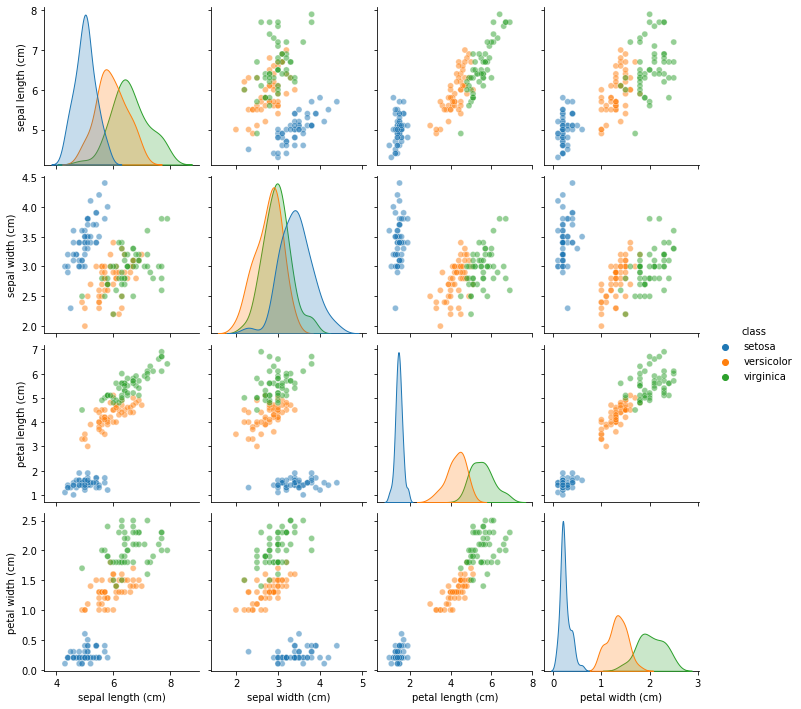

In [88]:
sns.pairplot(X, hue='class', plot_kws={'alpha':0.5}, vars=iris.feature_names)
plt.show()

Time of work is  1.1652398109436035


<Figure size 1080x720 with 0 Axes>

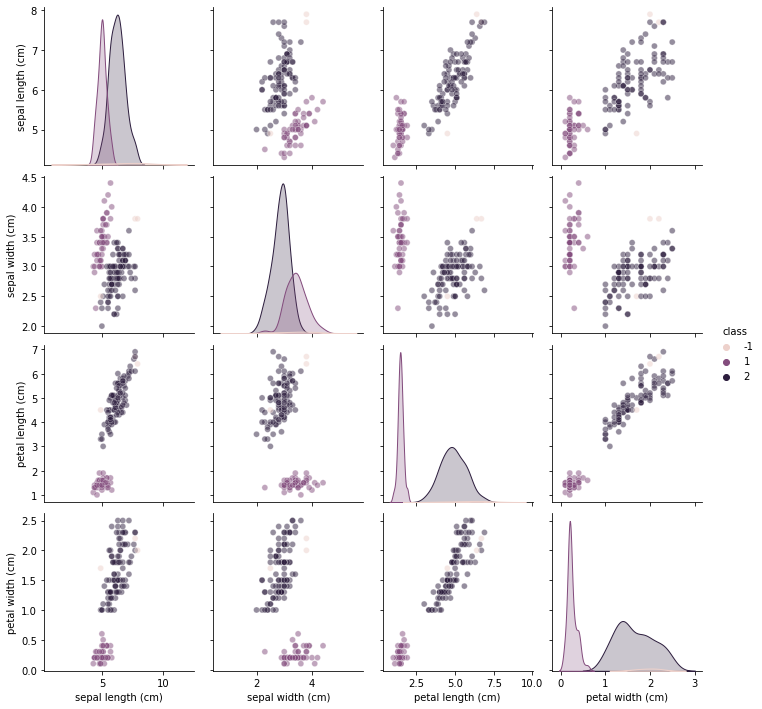

In [1035]:
X = iris.data
start_time = time.time()
my_dbscan = My_Clust(eps=0.7, min_samples=5)
kt = my_dbscan.fit(X)
labels_db = kt.predict(X)
print("Time of work is ",time.time() - start_time)
X = pd.DataFrame(X, columns=iris.feature_names)
X['class'] = labels_db
plt.figure(figsize=(15,10))
sns.pairplot(X, hue='class', plot_kws={'alpha':0.5}, vars=iris.feature_names)

Time of work is  0.004807949066162109


<Figure size 1080x720 with 0 Axes>

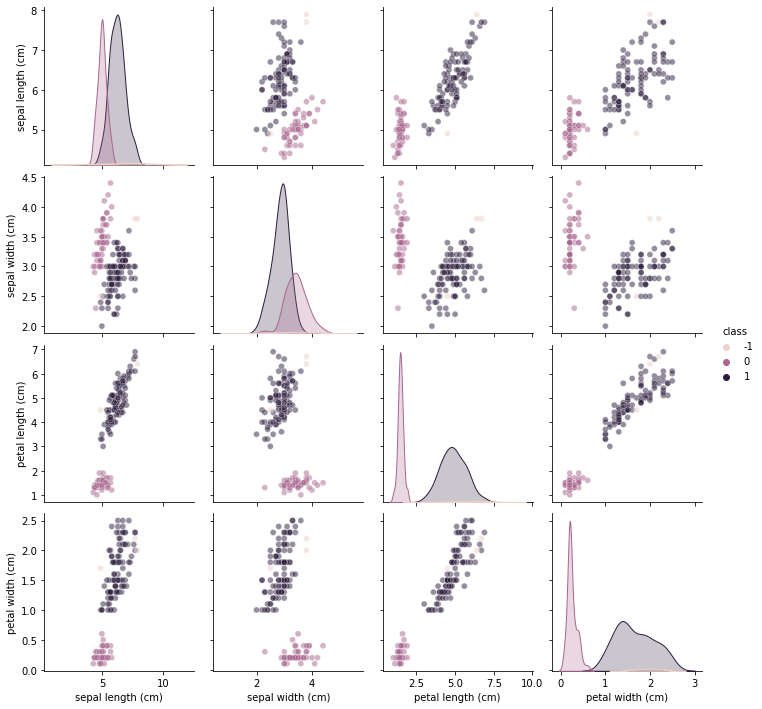

In [1036]:
X = iris.data
start_time = time.time()
db = DBSCAN(eps=0.7, min_samples=5)
labels_dbscan = db.fit_predict(X)
print("Time of work is ",time.time() - start_time)
X = pd.DataFrame(X, columns=iris.feature_names)
X['class'] = labels_dbscan
plt.figure(figsize=(15,10))
sns.pairplot(X, hue='class', plot_kws={'alpha':0.5}, vars=iris.feature_names)

Подбирая различные сочетания параметров, можно увидеть, что кластеризация работает одинаково в обоих алгоритмах

Как мы видим алгоритмы совпадают, у стандартного алгоритма присутствует незначительное преимущество в скорости

### Бонусное  
  
Дополнительно вы можете поработать над эффективностью алгоритма по скорости и памяти, добавить поддержку многопоточности, или расширить базовый функционал.

### Распределение по вариантам

In [6]:
pd.set_option('display.max_rows', 50)

In [7]:
Vars = pd.read_csv('Vars.txt', sep='\t')

#### Вариант №1

In [8]:
Vars[Vars.iloc[:,2] == 1]

,ФИО,Группа,Вариант №
0,Бакурский Андрей Сергеевич,1 ИАД,1
2,Бекина Светлана Сергеевна,1 ИАД,1
3,Бекусов Михаил Александрович,1 ИАД,1
9,Конина Татьяна Дмитриевна,1 ИАД,1
11,Лукичева Полина Александровна,1 ИАД,1
12,Моничева Арина Александровна,1 ИАД,1
22,Трухин Егор Сергеевич,1 ИАД,1
23,Шарунов Евгений Александрович,1 ИАД,1
24,Шатилов Виктор Алексеевич,1 ИАД,1
27,Астахова Елизавета Евгеньевна,2 ИАД,1


#### Вариант №2

In [9]:
Vars[Vars.iloc[:,2] == 2]

,ФИО,Группа,Вариант №
1,Балаян Роман Каренович,1 ИАД,2
5,Даняев Артем Андреевич,1 ИАД,2
7,Ешманов Павел Андреевич,1 ИАД,2
10,Костин Андрей Олегович,1 ИАД,2
15,Ожиганова Полина Максимовна,1 ИАД,2
17,Сапожников Андрей Михайлович,1 ИАД,2
18,Семаев Никита Юрьевич,1 ИАД,2
21,Суворов Артём Андреевич,1 ИАД,2
25,Южаков Максим Вячеславович,1 ИАД,2
28,Бабий Александр Сергеевич,2 ИАД,2


#### Вариант №3

In [10]:
Vars[Vars.iloc[:,2] == 3]

,ФИО,Группа,Вариант №
4,Боряев Сергей Сергеевич,1 ИАД,3
6,Дыряев Даниил Александрович,1 ИАД,3
8,Игумнова Наталья Дмитриевна,1 ИАД,3
13,Мурзинов Михаил Денисович,1 ИАД,3
14,Николаева Олеся Игоревна,1 ИАД,3
16,Османов Ислам Рамилевич,1 ИАД,3
19,Смирнов Григорий Андреевич,1 ИАД,3
20,Стифеев Никита Владимирович,1 ИАД,3
26,Арбузова Екатерина Михайловна,2 ИАД,3
31,Варгин Дмитрий Александрович,2 ИАД,3


# Часть 2

В данном задании вам предлагается проанализировать набор данных по различным городам США. Каждый город характеризуется следующими признаками:

In [2]:
pd.set_option('display.max_colwidth', None)

In [44]:
data_desc = pd.read_csv('Data_Description.txt', sep=':')
data_desc

,Attribute,Description
0,Place,"City, state (postal code)"
1,Climate & Terrain,"Very hot and very cold months, seasonal temper..."
2,Housing,"Utility bills, property taxes, mortgage payments."
3,Health Care & Environment,"Per capita physicians, teaching hospitals, med..."
4,Crime,"Violent crime rate, property crime rate."
5,Transportation,"Daily commute, public transportation, Intersta..."
6,Education,"Pupil/teacher ratio in the public K-12 system,..."
7,The Arts,"Museums, fine arts and public radio stations, ..."
8,Recreation,"Good restaurants, public golf courses, certifi..."
9,Economics,Average household income adjusted for taxes an...


### Notes:   
* Для всех признаков, кроме трех, чем выше значение - тем лучше. Для признаков `Housing` и `Crime` - наоборот.
* Признак `Population`- статистический признак, не имеющий интерпретации как “лучше-хуже”.
* Признак `Place` - уникальный идентификатор объекта (города), он не должен использоваться при кластеризации.
* Также в данных присутствуют географические координаты городов - `Longitude` и `Latitude`. Их также не следует использовать при кластеризации данных.

In [5]:
data = pd.read_csv('Data.txt', sep=' ')
data

,Place,Climate,HousingCost,HlthCare,Crime,Transp,Educ,Arts,Recreat,Econ,Long,Lat,Pop
0,"Abilene,TX",521,6200,237,923,4031,2757,996,1405,7633,-99.6890,32.5590,110932
1,"Akron,OH",575,8138,1656,886,4883,2438,5564,2632,4350,-81.5180,41.0850,660328
2,"Albany,GA",468,7339,618,970,2531,2560,237,859,5250,-84.1580,31.5750,112402
3,"Albany-Schenectady-Troy,NY",476,7908,1431,610,6883,3399,4655,1617,5864,-73.7983,42.7327,835880
4,"Albuquerque,NM",659,8393,1853,1483,6558,3026,4496,2612,5727,-106.6500,35.0830,419700
...,...,...,...,...,...,...,...,...,...,...,...,...,...
324,"Worcester,MA",562,8715,1805,680,3643,3299,1784,910,5040,-71.7950,42.2720,402918
325,"Yakima,WA",535,6440,317,1106,3731,2491,996,2140,4986,-120.5130,46.5950,172508
326,"York,PA",540,8371,713,440,2267,2903,1022,842,4946,-76.7280,39.9600,381255
327,"Youngstown-Warren,OH",570,7021,1097,938,3374,2920,2797,1327,3894,-80.7290,41.1700,531350


<br>  
  
## Задания: 

1. Выполните необходимую предобработку данных. Перед кластеризацией исключите из данных признаки `Place`, `Long` и `Lat`.  
  
  
2. Выполните кластеризацию иерархическим методом.  
Рассмотрите различные расстояния между объектами. Определите, какие следует использовать при кластеризации.  
Выполните кластеризацию с различными расстояниями между кластерами. Сравните результаты, сделайте выводы. 
  
  
3. Выполните кластеризацию методом Dbscan. Используйте расстояния между объектами, определенные в предыдущем пункте.  
Реализуйте эвристику (см. лекции) для выбора параметров алгоритма. Подберите подходящие параметры алгоритма.  
  
  
4. Выполните кластеризацию методом kmeans. Определите наилучшее (на ваш взгляд) число кластеров.  
  
  
5. (Бонусное) Выполните кластеризацию другими методами. Например, [HDBSCAN](https://hdbscan.readthedocs.io/en/latest/) или алгоритмы, [реализованные](https://scikit-learn.org/stable/modules/clustering.html) в scikit-learn.  
  
  
6. В результате выполнения предыдущих пунктов вы должны получить 4 или больше разбиений объектов (по одному на каждый метод). Сравните их между собой, сделайте выводы о сходствах и различиях.  
Оцените результаты каждой кластеризации, используя метрики, рассмотренные на занятиях (Silhouette и прочие).  
  
  
7. Выберите одно разбиение, наиболее подходящее на ваш взгляд. Предложите интерпретацию полученным кластерам или покажите, что этого сделать нельзя.  
  
  
8. Оцените, как полученные кластеры распределены географически.  
Оцените, как полученные кластеры распределены по штатам. Можно ли выделить какую-то зависимость (территориальную или для штатов)?  
(Бонусное) [Провизуализируйте](https://python-visualization.github.io/folium/quickstart.html) распределение на карте США.

№1

In [6]:
data_1 = data

Уберем часть данных, которая нам не понадобится при кластеризации

In [7]:
data = data.drop('Long', 1)
data = data.drop('Lat', 1)
data = data.drop('Place', 1)
data

,Climate,HousingCost,HlthCare,Crime,Transp,Educ,Arts,Recreat,Econ,Pop
0,521,6200,237,923,4031,2757,996,1405,7633,110932
1,575,8138,1656,886,4883,2438,5564,2632,4350,660328
2,468,7339,618,970,2531,2560,237,859,5250,112402
3,476,7908,1431,610,6883,3399,4655,1617,5864,835880
4,659,8393,1853,1483,6558,3026,4496,2612,5727,419700
...,...,...,...,...,...,...,...,...,...,...
324,562,8715,1805,680,3643,3299,1784,910,5040,402918
325,535,6440,317,1106,3731,2491,996,2140,4986,172508
326,540,8371,713,440,2267,2903,1022,842,4946,381255
327,570,7021,1097,938,3374,2920,2797,1327,3894,531350


Преобразуем датасет к значениям от 0 до 1, чтобы было легче с ними работать и визуализировать их

In [8]:
from sklearn import preprocessing
from sklearn.preprocessing import MinMaxScaler
minmax = MinMaxScaler()
data_new = minmax.fit_transform(data) 
data_new

array([[0.51677019, 0.05632812, 0.02484949, ..., 0.24555556, 0.66157174,
        0.00585864],
       [0.58385093, 0.16119258, 0.20660945, ..., 0.51822222, 0.18817592,
        0.0727591 ],
       [0.45093168, 0.11795898, 0.07365185, ..., 0.12422222, 0.31795242,
        0.00603765],
       ...,
       [0.54037267, 0.17380012, 0.08582042, ..., 0.12044444, 0.2741168 ,
        0.03877612],
       [0.57763975, 0.10075212, 0.13500704, ..., 0.22822222, 0.12242249,
        0.05705333],
       [0.62484472, 0.14696174, 0.02164724, ..., 0.13733333, 0.23777938,
        0.00476843]])

In [9]:
data_scaled = pd.DataFrame(data_new,columns = data.columns)
data_scaled

,Climate,HousingCost,HlthCare,Crime,Transp,Educ,Arts,Recreat,Econ,Pop
0,0.516770,0.056328,0.024849,0.280822,0.385829,0.507692,0.016651,0.245556,0.661572,0.005859
1,0.583851,0.161193,0.206609,0.263927,0.499733,0.354327,0.097225,0.518222,0.188176,0.072759
2,0.450932,0.117959,0.073652,0.302283,0.185294,0.412981,0.003263,0.124222,0.317952,0.006038
3,0.460870,0.148747,0.177789,0.137900,0.767112,0.816346,0.081192,0.292667,0.406489,0.094136
4,0.688199,0.174991,0.231843,0.536530,0.723663,0.637019,0.078387,0.513778,0.386734,0.043458
...,...,...,...,...,...,...,...,...,...,...
324,0.567702,0.192414,0.225695,0.169863,0.333957,0.768269,0.030551,0.135556,0.287671,0.041414
325,0.534161,0.069314,0.035097,0.364384,0.345722,0.379808,0.016651,0.408889,0.279885,0.013357
326,0.540373,0.173800,0.085820,0.060274,0.150000,0.577885,0.017110,0.120444,0.274117,0.038776
327,0.577640,0.100752,0.135007,0.287671,0.297995,0.586058,0.048419,0.228222,0.122422,0.057053


№2

Построим дендрограмму для кластеризации

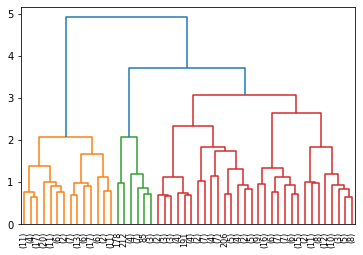

In [35]:
import pandas as pd
import scipy.cluster.hierarchy as h
%matplotlib inline
Z = h.linkage(data_new,method = 'ward', metric ="euclidean")
labels = h.fcluster(Z, t=3, criterion='maxclust')
_=h.dendrogram(Z,p=50,truncate_mode='lastp')

Судя по всему, тут 2-3-4 кластера, сильной разницы между ними не видно,поэтому я предпочту выбрать 3 кластера для данного датасета

Построим pairpot для различных метрик и методов

Напишу сразу, что евклидово расстояние между объектами и метрика Варда оказалась наиболее подходящей для данного датасета, на графике ниже можно увидеть, что кластеризация прошла более или менее успешно, по сравнению с остальными методами и дистанциями

<Figure size 1080x720 with 0 Axes>

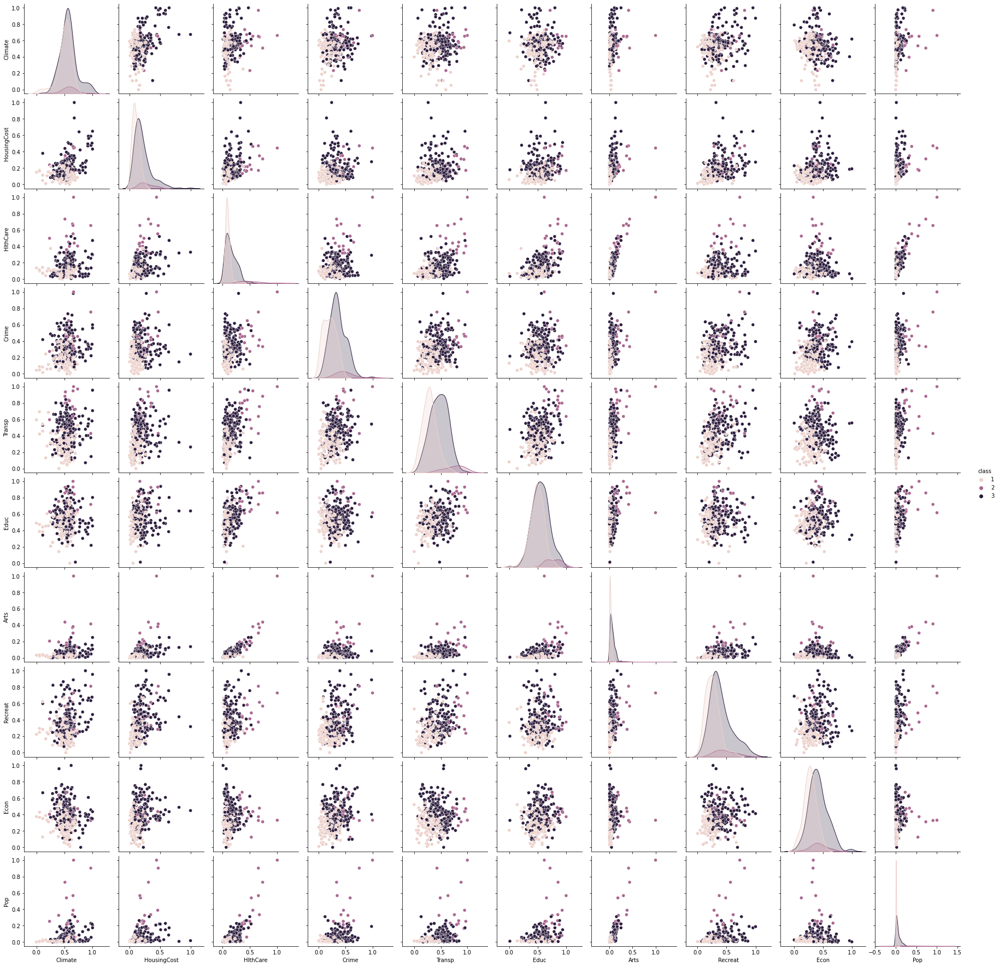

In [157]:
import seaborn as sns
Z = h.linkage(data_new,method = 'ward', metric ="euclidean")
labels_h = h.fcluster(Z, t=3, criterion='maxclust')
data_pred = data_scaled.copy()
data_pred['class'] = labels_h
plt.figure(figsize=(15,10))
sns.pairplot(data_pred, hue='class')
plt.show()

Для single-linkage с тем же измерением дистанциикластеризация вообще почти не сработала нормально

<Figure size 1080x720 with 0 Axes>

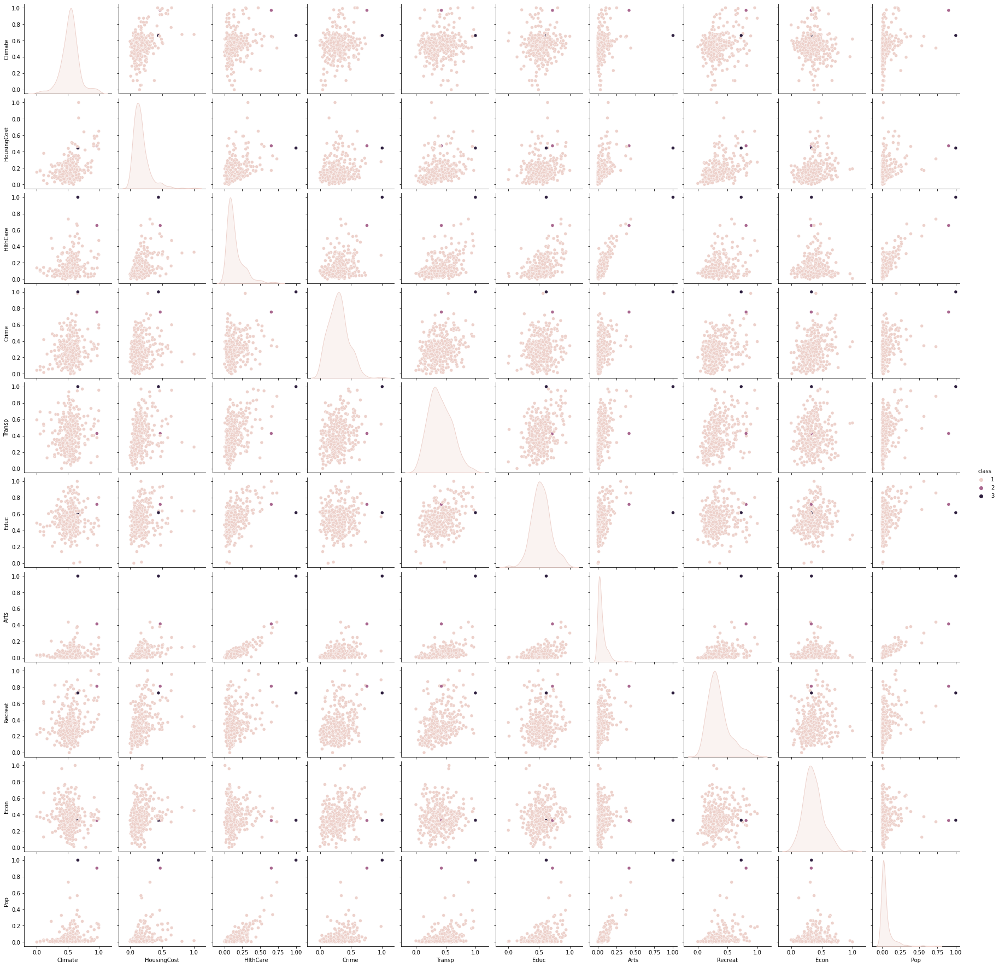

In [37]:
import seaborn as sns
Z = h.linkage(data_new,method = 'single', metric ="euclidean")
labels = h.fcluster(Z, t=3, criterion='maxclust')
data_pred = data_scaled.copy()
data_pred['class'] = labels
plt.figure(figsize=(15,10))
sns.pairplot(data_pred, hue='class')
plt.show()

С Канберровской дистанцией сработало получше, но кластеризация на некоторых графиках не очень хорошая

<Figure size 1080x720 with 0 Axes>

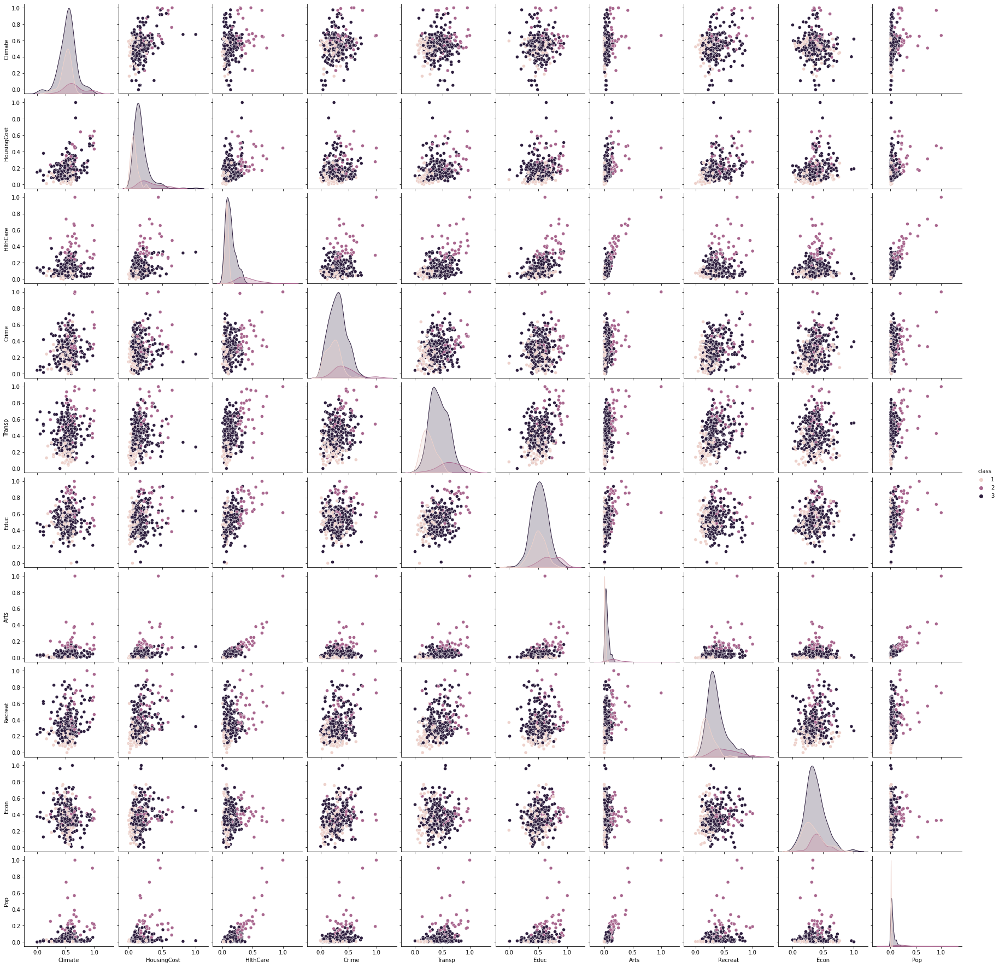

In [46]:
import seaborn as sns
Z = h.linkage(data_new,method="complete", metric ="canberra")
labels_h = h.fcluster(Z, t=3, criterion='maxclust')
data_pred = data_scaled.copy()
data_pred['class'] = labels_h
plt.figure(figsize=(15,10))
sns.pairplot(data_pred, hue='class')
plt.show()

Я проверил всевозможные сочетания метрик и методов, выводить все не стал, но почти на всех кластеризация сработала плохо

<Figure size 1080x720 with 0 Axes>

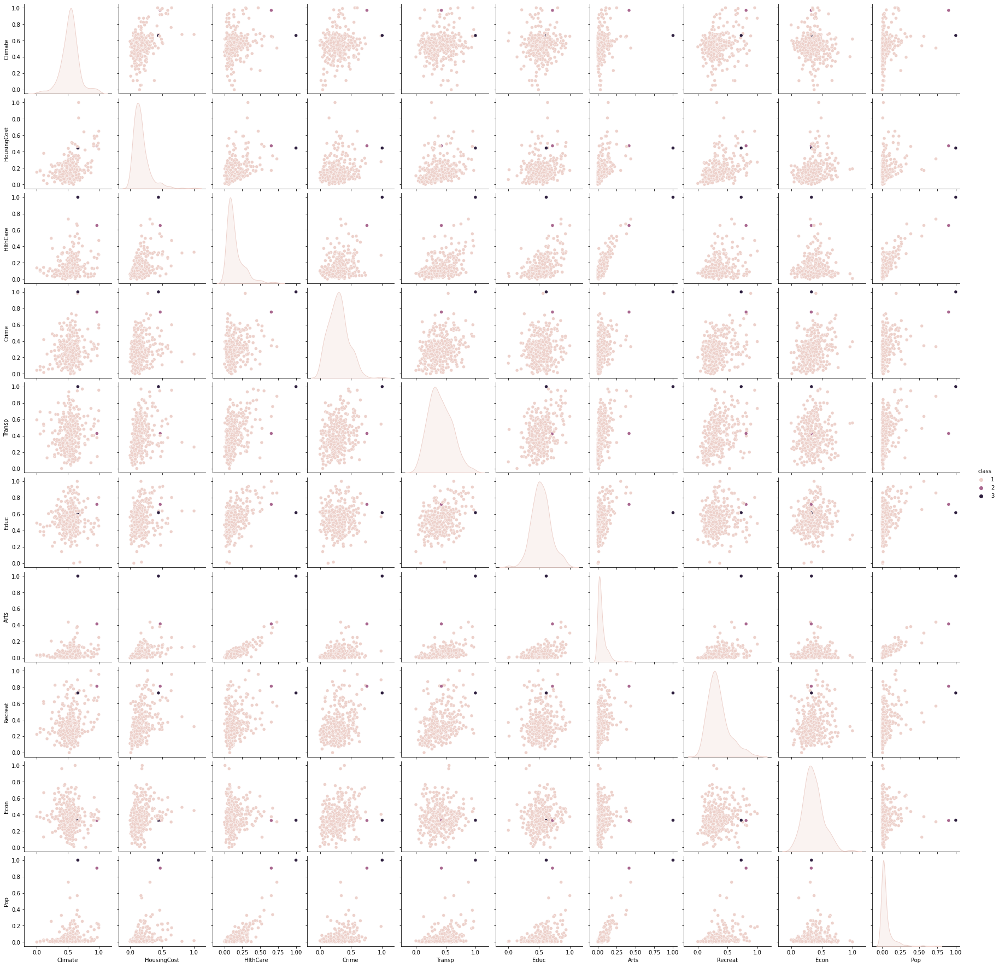

In [41]:
import seaborn as sns
Z = h.linkage(data_new,metric ="mahalanobis")
labels = h.fcluster(Z, t=3, criterion='maxclust')
data_pred = data_scaled.copy()
data_pred['class'] = labels
plt.figure(figsize=(15,10))
sns.pairplot(data_pred, hue='class')
plt.show()

Таким образом, для иерархической кластеризации я выберу евклидово расстояние между объектами с методом Варда

№3

Теперь посмотрим на dbscan, если подбирать различные значения для параметров eps и min_samples, то для данного датасета либо огромное количество выбросов, либо большинство значений не определяются в кластеры, в общем неравномерное распределения и можно сказать, что dbscan не очень подходит данному датасету

In [678]:
from sklearn.cluster import DBSCAN
db = DBSCAN(eps=0.3, min_samples=2)
labels_dbscan = db.fit_predict(data_scaled)
labels_dbscan

array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1, -1,  0,  0, -1,  0,  0,
        0,  0, -1,  0,  0,  0,  0,  0,  2,  0,  0,  0,  0,  0, -1,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0, -1, -1,  0,  0, -1,  3,  0,  0,  0,
        0,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0,  0,  0, -1,  0,  0,  0,
       -1,  0,  0,  0,  0,  0,  0,  0, -1,  3,  0,  0,  0,  0,  0, -1,  0,
       -1,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0, -1, -1,  0,  0,  0,  0,  0,  0, -1,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, -1,  0,  4, -1, -1,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  5,  0,  0,  0,  0,  0,  0,  0, -1,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0, -1,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0, -1,  0,  0,  5,  0, -1,  0,  0,  0,  0,  0,  0,  0,
        0,  0, -1,  0,  0,  0,  0, -1, -1, -1,  0,  0,  6, -1,  0, -1,  0,
        0,  0,  0,  0,  0

In [674]:
[sum(labels_dbscan==x) for x in range(10)]

[181, 2, 2, 5, 5, 2, 6, 2, 5, 2]

Опять же, по графику видно, что разбиение плохое

<Figure size 1080x720 with 0 Axes>

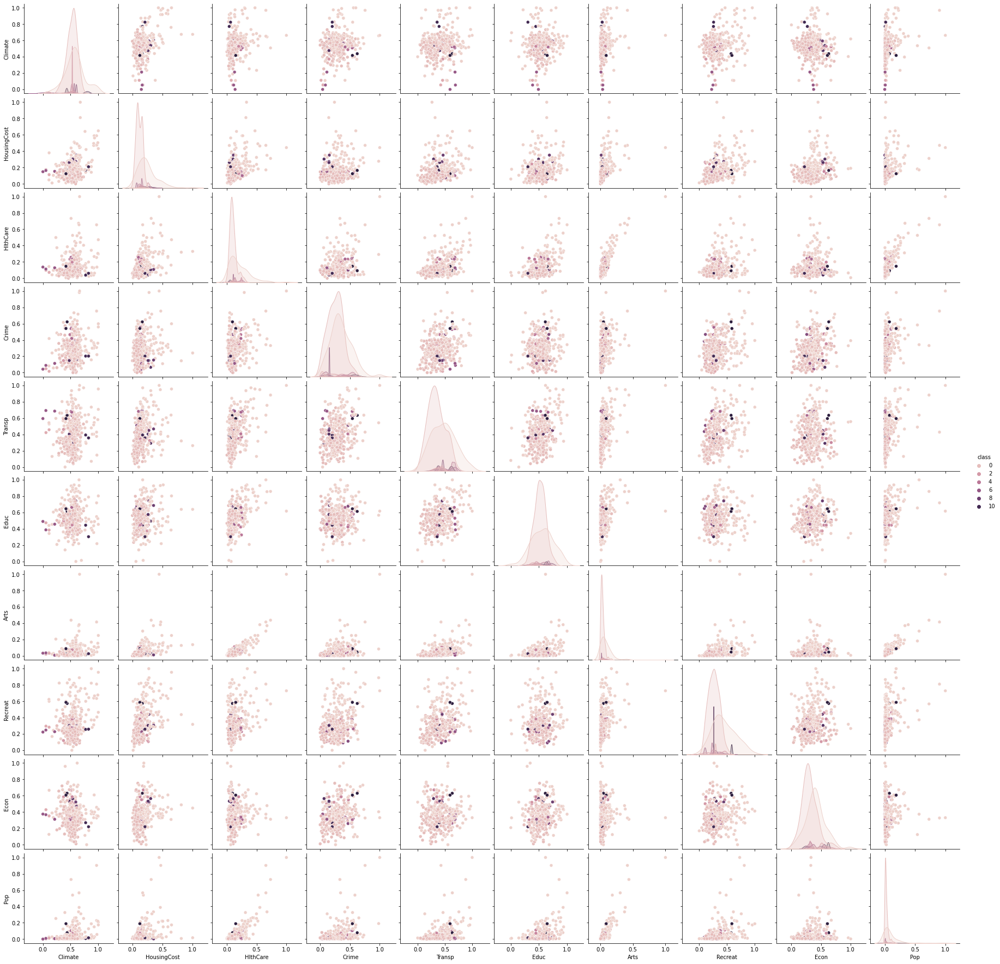

In [65]:
data_pred = data_scaled.copy()
data_pred['class'] = labels_dbscan
plt.figure(figsize=(15,10))
sns.pairplot(data_pred, hue='class')
plt.show()

Посмотрим через эвристику оптимальные значения для параметров, для различного числа соседей и eps

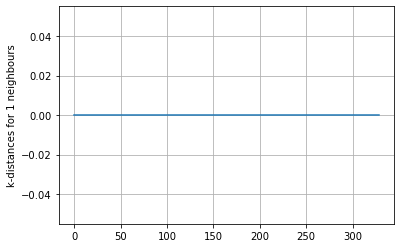

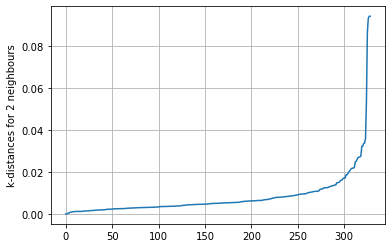

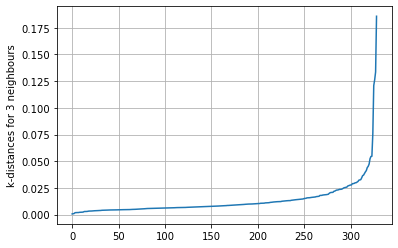

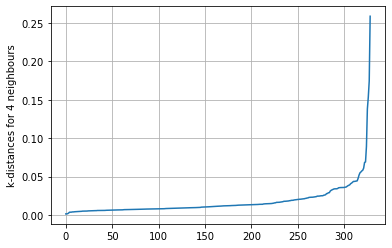

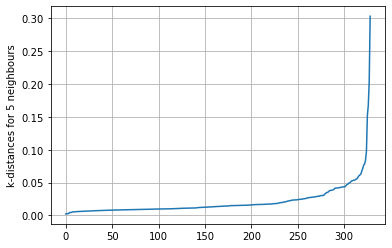

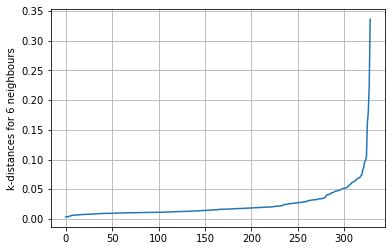

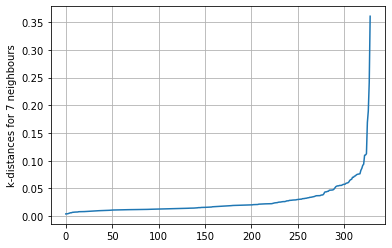

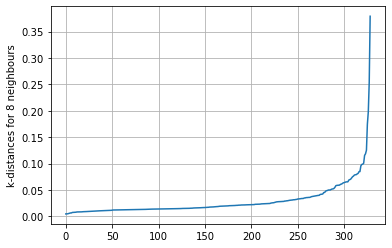

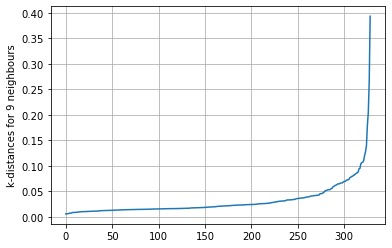

In [67]:
def k_neib(a, data, n):
    return sum(sorted(math.sqrt( (a[0] - b[0])**2 + (a[1] - b[1])**2 ) for b in data)[: n]) / n
def all_knn(min_pts, data):
    all_knn = []
    for i in data:
        all_knn.append(k_neib(i, data, min_pts))
    return sorted(all_knn)
for min_pts in range(1,10):
    nbrs = all_knn(min_pts, data_new)
    plt.plot(nbrs)
    plt.ylabel(f"k-distances for {min_pts} neighbours")
    plt.grid(True)
    plt.show()

оптимальные параметры находятся в зоне пеегиба кривой, но, подставив их, можно увидеть,что это не улучшает кластеризацию

№4

Рассмотрим Kmeans, сразу построим график инерции

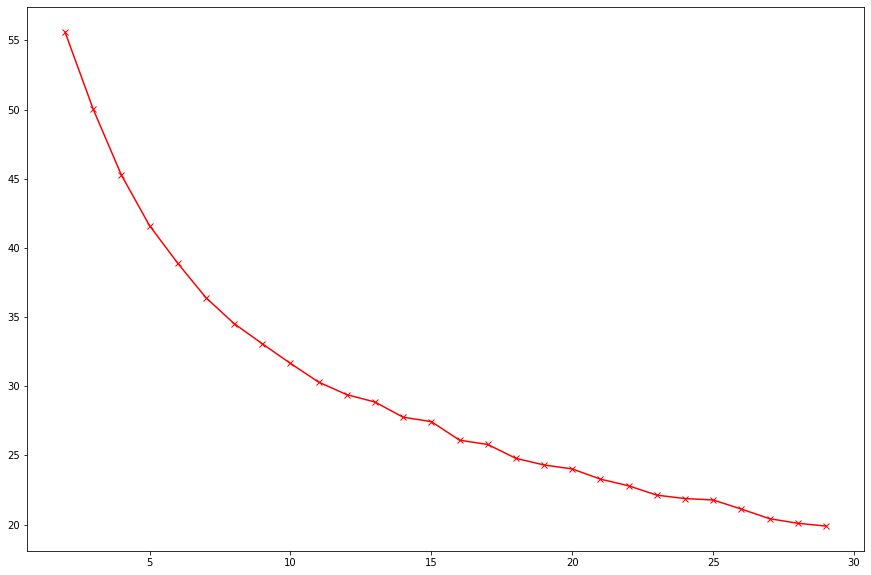

In [13]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_mutual_info_score, silhouette_score
plt.figure(figsize=(15,10))
inertia = []
for i in range(2,30):
    km = KMeans(n_clusters = i,n_init=10)
    km.fit(data_scaled)
    labels = km.predict(data_scaled)
    inertia.append(km.inertia_)
plt.plot(range(2,30), inertia, 'x-r')
plt.show()

Тут нет явных точек для количества кластера, может быть, подойдут кластеры от 5 до 15.

Далее построим силует

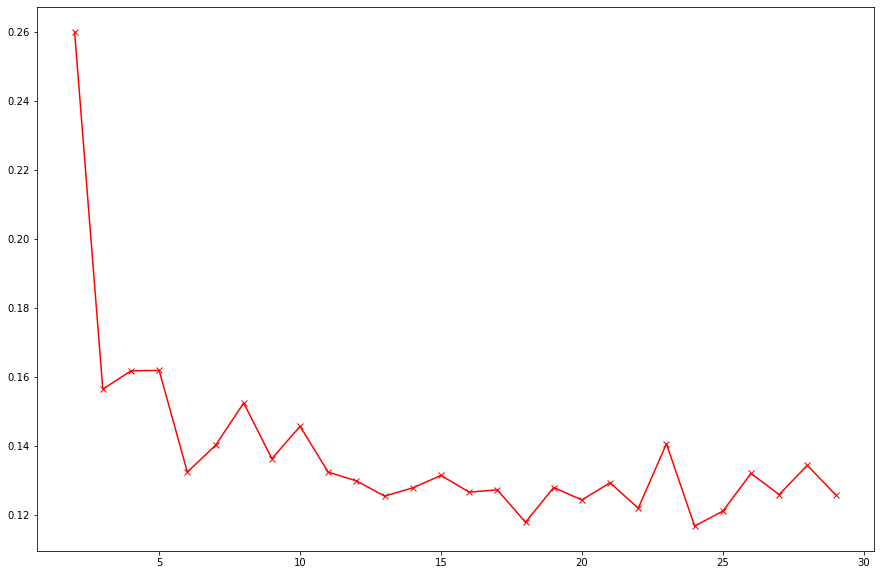

In [62]:
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_mutual_info_score, silhouette_score
plt.figure(figsize=(15,10))
inertia = []
for i in range(2,30):
    km = KMeans(n_clusters = i,n_init=10)
    km.fit(data_scaled)
    labels = km.predict(data_scaled)
    inertia.append(silhouette_score(data_scaled,labels))
plt.plot(range(2,30), inertia, 'x-r')
plt.show()

Судя по силуэту, можно сказать, что 2 кластера показывают наилучший результат, далее идут 3-4 и 5 кластеров

In [21]:
kmeans = KMeans(n_clusters=2, n_init=10).fit(data_scaled)
labels_km = kmeans.predict(data_scaled)

In [22]:
labels_km

array([0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0,
       1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0,
       0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0,
       1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 1, 0,
       0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0,
       1, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0,
       1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0,
       1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0,

Как мы видим, при 2 кластерах, большинство из ник так и не полуучили значение

In [603]:
kmeans = KMeans(n_clusters=3, n_init=10).fit(data_scaled)
labels_km = kmeans.predict(data_scaled)

In [548]:
labels_km

array([1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 2, 0, 1,
       1, 1, 1, 2, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 2, 0,
       1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 0, 1, 2, 1,
       0, 1, 2, 0, 1, 0, 1, 0, 1, 1, 2, 0, 1, 1, 1, 0, 1, 2, 0, 2, 1, 1,
       1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0,
       1, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1,
       0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0,
       1, 0, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1,
       1, 1, 2, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 2, 0, 0, 0, 0, 0, 1,
       1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 2, 2, 1, 0, 0, 2, 0, 1,
       0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 2, 0, 1, 2, 1, 0, 0, 1, 1,
       0, 1, 1, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 1, 1, 2, 0, 0,
       0, 0, 1, 0, 2, 2, 0, 0, 0, 0, 0, 0, 1, 2, 1, 1, 1, 0, 1, 1, 0, 1,
       0, 0, 1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1,

In [605]:
[sum(labels_km==x) for x in range(10)]

[19, 124, 186, 0, 0, 0, 0, 0, 0, 0]

In [870]:
kmeans = KMeans(n_clusters=4, n_init=10).fit(data_scaled)
labels_km = kmeans.predict(data_scaled)

In [873]:
labels_km

array([3, 0, 3, 1, 1, 3, 3, 1, 3, 1, 0, 0, 3, 3, 1, 3, 3, 1, 3, 1, 0, 3,
       3, 3, 3, 2, 1, 3, 3, 3, 3, 0, 3, 1, 1, 3, 3, 1, 3, 3, 1, 1, 2, 0,
       3, 3, 3, 0, 3, 3, 3, 3, 1, 3, 1, 3, 3, 3, 1, 1, 1, 1, 1, 3, 2, 3,
       1, 3, 2, 0, 3, 1, 3, 1, 3, 3, 1, 0, 3, 3, 1, 0, 3, 1, 1, 2, 3, 3,
       3, 1, 3, 3, 3, 3, 3, 3, 0, 3, 3, 1, 3, 3, 3, 3, 3, 1, 0, 0, 0, 0,
       3, 3, 1, 0, 0, 3, 1, 0, 1, 3, 3, 3, 3, 3, 3, 1, 1, 3, 3, 1, 1, 3,
       0, 3, 1, 3, 3, 1, 3, 3, 1, 1, 3, 3, 1, 3, 3, 3, 3, 1, 3, 1, 1, 1,
       3, 0, 3, 1, 3, 0, 3, 0, 3, 3, 1, 3, 3, 0, 3, 0, 3, 3, 1, 3, 1, 3,
       3, 3, 2, 1, 3, 3, 3, 3, 1, 3, 3, 3, 3, 0, 1, 2, 1, 1, 0, 1, 1, 3,
       3, 0, 3, 3, 3, 3, 3, 1, 0, 3, 1, 1, 1, 0, 2, 2, 3, 0, 0, 2, 0, 3,
       1, 3, 1, 3, 1, 3, 0, 3, 3, 3, 1, 3, 3, 2, 1, 3, 1, 3, 0, 1, 3, 3,
       1, 0, 3, 3, 1, 3, 0, 1, 3, 1, 0, 3, 3, 1, 3, 1, 3, 3, 3, 1, 1, 0,
       0, 0, 3, 1, 0, 2, 0, 0, 0, 0, 0, 1, 3, 2, 3, 3, 3, 1, 3, 1, 1, 1,
       1, 1, 3, 0, 3, 3, 3, 1, 0, 1, 1, 3, 3, 1, 1,

In [872]:
[sum(labels_km==x) for x in range(10)]

[54, 91, 14, 170, 0, 0, 0, 0, 0, 0]

Результат с 5 кластерами давал много нулей, с 4 и 3 дал неплохие результаты, выберу 4, вдруг жилье распределится на 4 стороны - север, юг , восток и запад

<Figure size 1080x720 with 0 Axes>

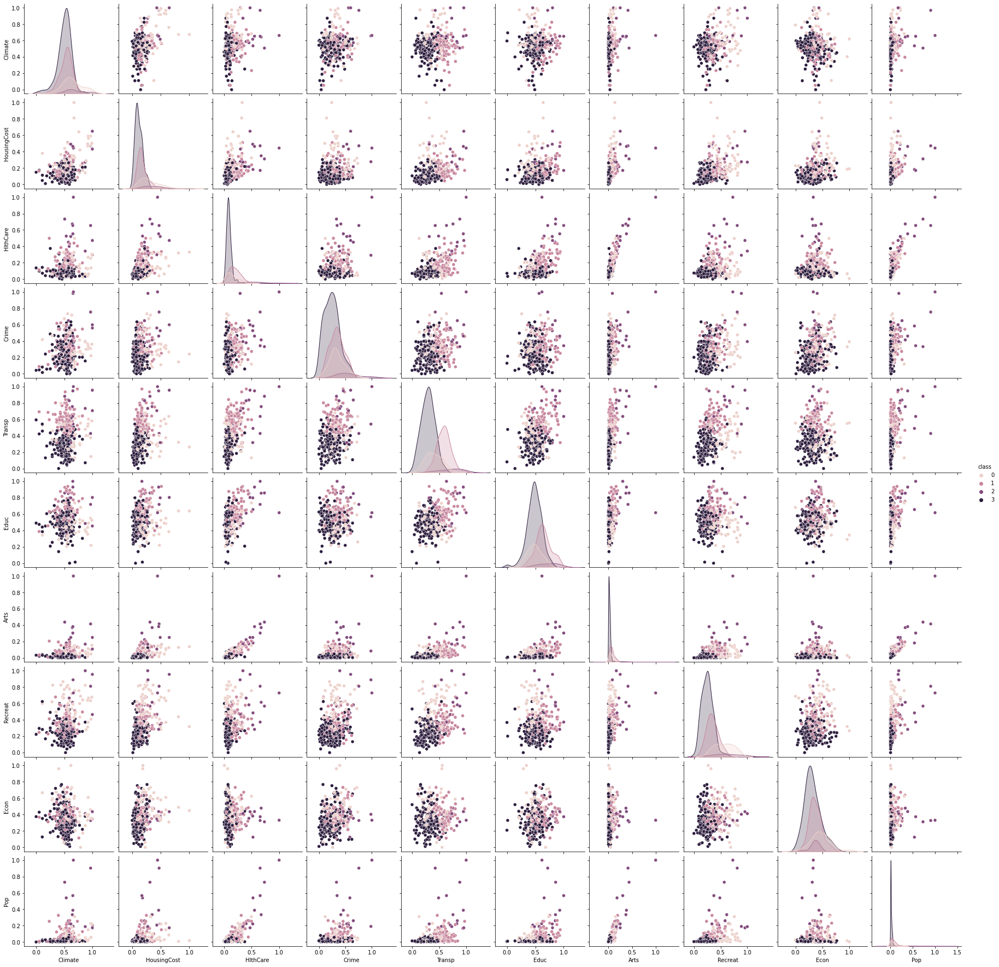

In [874]:
data_pred = data_scaled.copy()
data_pred['class'] = labels_km
plt.figure(figsize=(15,10))
sns.pairplot(data_pred, hue='class')
plt.show()

№5

Теперь посмотрим на hdbscan

In [685]:
import hdbscan
clusterer = hdbscan.HDBSCAN(min_cluster_size=2,metric='euclidean').fit(data_scaled)
labels_hb = clusterer.labels_

In [686]:
[sum(labels_hb==x) for x in range(11)]

[2, 2, 2, 253, 0, 0, 0, 0, 0, 0, 0]

In [660]:
import hdbscan
clusterer = hdbscan.HDBSCAN(min_cluster_size=2,metric='hamming').fit(data_scaled)
labels_hb = clusterer.labels_

In [661]:
[sum(labels_hb==x) for x in range(11)]

[2, 3, 2, 3, 2, 8, 5, 2, 4, 2, 258]

Возьмем евклидово расстояние, там хотя бы меньше кластеров

<Figure size 1080x720 with 0 Axes>

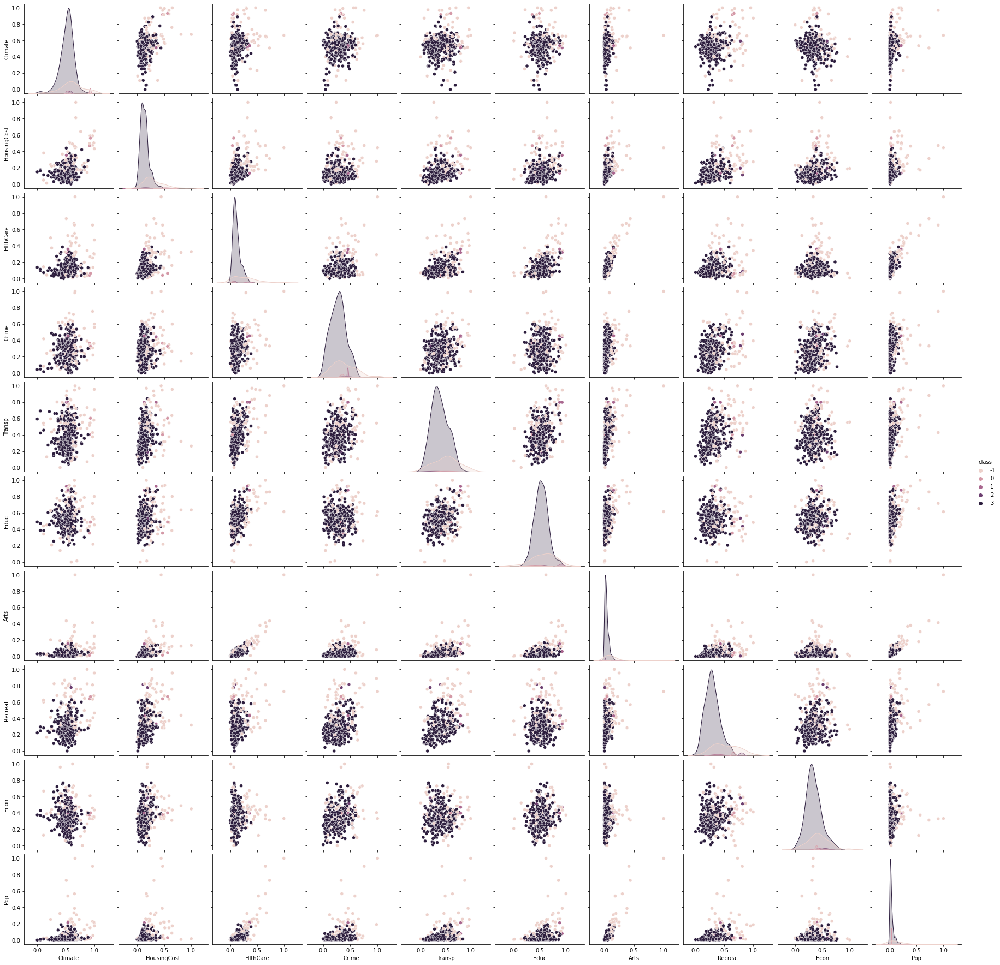

In [687]:
data_pred = data_scaled.copy()
data_pred['class'] = labels_hb
plt.figure(figsize=(15,10))
sns.pairplot(data_pred, hue='class')
plt.show()

№6

Сравним выбранные кластеризации через silhouette score

Для агломеративной кластеризации с ward и euclidean distance

In [183]:
from sklearn.metrics import adjusted_mutual_info_score, silhouette_score
silhouette_score(data_scaled,labels_h)

0.13781545274723117

Для дбскана

In [680]:
silhouette_score(data_scaled,labels_dbscan)

0.10354014262155531

Для 4 кластеров kmeans

In [875]:
silhouette_score(data_scaled,labels_km)

0.18119202462015102

Для hdbscan

In [688]:
silhouette_score(data_scaled,labels_hb)

0.104436904730705

Очевидно, лучшим здесь будет kmeans с 4 кластерами

№7-8

Здесь я совмещу 7 и 8 задания, сначала посмотрим на результаты каждого кластера и оценим их, затем посмотрим результаты на карте США

In [690]:
def coord(ind):
    l1 = []
    l2 = []
    tl = []
    for i in data_scaled[labels_km==ind].index:
        l1.append(i)
    for i in data_1.index:
        tl = []
        if i in l1:
            tl.append(data_1.iloc[i]["Lat"])
            tl.append(data_1.iloc[i]["Long"])
            l2.append(tl)
    return l2

Начнем с нераспределившихся мест, с нулеыми кластерами

In [881]:
data_scaled[labels_km==0]

,Climate,HousingCost,HlthCare,Crime,Transp,Educ,Arts,Recreat,Econ,Pop
1,0.583851,0.161193,0.206609,0.263927,0.499733,0.354327,0.097225,0.518222,0.188176,0.072759
10,0.968944,0.589146,0.253875,0.308219,0.375535,0.549038,0.098425,0.634667,0.457823,0.227698
11,0.111801,0.379633,0.071474,0.417808,0.527540,0.342788,0.040464,0.600000,0.666619,0.013591
20,0.633540,0.320058,0.076086,0.716895,0.322326,0.590385,0.010037,0.535778,0.729921,0.026006
31,0.828571,0.171528,0.025234,0.236073,0.351738,0.517788,0.022049,0.644444,0.173324,0.005343
43,0.439752,0.365511,0.117715,0.356164,0.797193,0.425962,0.063694,0.824889,0.588609,0.015441
47,0.674534,0.447487,0.321122,0.289954,0.274332,0.638462,0.146685,0.358444,0.598702,0.045754
69,0.522981,0.181267,0.086845,0.355251,0.300000,0.506250,0.029933,0.461111,0.671089,0.030029
77,0.576398,0.501109,0.295504,0.109589,0.209893,0.638462,0.129875,0.282667,0.578947,0.013096
81,0.566460,0.110600,0.087101,0.474429,0.397326,0.437981,0.013353,0.814889,0.511464,0.023860


In [882]:
print("Mean values for 0:")
for i in data_scaled[labels_km==0]:
    print(i,(data_scaled[labels_km==0][i]).mean())

Mean values for 0:
Climate 0.6317690361168624
HousingCost 0.30726752400363133
HlthCare 0.14546299854356723
Crime 0.3443937087772703
Transp 0.4003466032877799
Educ 0.4782229344729345
Arts 0.062278248474075135
Recreat 0.5625020576131688
Econ 0.4684290635263959
Pop 0.05682323597779507


У данных мест довольно благоприятный климат, который варьируется в высоких значениях, высокий уровень recreationa. У всех этих мест низникй уровень health care и малнькое население. Судя по всему это связано, так как нет жителей - нет инфраструктуры для них.

Посмотрим как это ыглядит на карте

In [898]:
import folium
m = folium.Map(location=[41.706998,-103.8218627], zoom_start=4)
cd0=coord(0)
for i in range(len(cd0)):
    folium.Marker(
        cd0[i]
    ).add_to(m)
m

Видим, что города расположились на восточном и западном побережьях, особенно много мест в Калифорнии и Флориде - курортных районах, становится логичным хрошие уровни recreational и climate. Маленькое население видимо потому, что все приезжие -непостоянные жители, эти места используют для отдыха

Теперь взглянем на кластер под номером 1

In [885]:
data_scaled[labels_km==1]

,Climate,HousingCost,HlthCare,Crime,Transp,Educ,Arts,Recreat,Econ,Pop
3,0.460870,0.148747,0.177789,0.137900,0.767112,0.816346,0.081192,0.292667,0.406489,0.094136
4,0.688199,0.174991,0.231843,0.536530,0.723663,0.637019,0.078387,0.513778,0.386734,0.043458
7,0.536646,0.071858,0.118099,0.181735,0.512032,0.598077,0.025312,0.217778,0.396539,0.025013
9,0.626087,0.075050,0.080184,0.349315,0.502273,0.553365,0.020867,0.179778,0.460851,0.013502
14,0.547826,0.316812,0.315742,0.346575,0.305882,0.790865,0.132415,0.441778,0.221197,0.024589
...,...,...,...,...,...,...,...,...,...,...
296,0.416149,0.123532,0.146791,0.541096,0.593984,0.645673,0.087983,0.587333,0.607210,0.188840
299,0.513043,0.141118,0.217113,0.315068,0.558556,0.553365,0.076500,0.367111,0.214708,0.067466
300,0.491925,0.105568,0.141540,0.315525,0.561898,0.525962,0.027869,0.186889,0.348810,0.011215
301,0.659627,0.295276,0.170232,0.398630,0.486765,0.774038,0.087789,0.299111,0.393223,0.029839


In [886]:
print("Mean values for 1:")
for i in data_scaled[labels_km==1]:
    print(i,(data_scaled[labels_km==1][i]).mean())

Mean values for 1:
Climate 0.5282642823015494
HousingCost 0.17238078192571996
HlthCare 0.19732643429325883
Crime 0.3361834512519444
Transp 0.5872553916671562
Educ 0.6400729078613693
Arts 0.07340887289029033
Recreat 0.34631990231990234
Econ 0.3706505462814043
Pop 0.07205366507258669


Заметим, что цена за жилье здесь находится в одном низком диапазоне, Так же здесь неплохо развита инфраструктура health care и environment. К тому же здесь есть неплохой транспорт, о чем свидетельствуют похожие значния в колонке transport, слабо развита туристическая инфраструктура(art и recreational), мало музеев и т.д. В этом районе маленькое население.

Взглянем на них на карте

In [897]:
import folium
m = folium.Map(location=[41.706998,-103.8218627], zoom_start=4)
cd0=coord(1)
for i in range(len(cd0)):
    folium.Marker(
        cd0[i]
    ).add_to(m)
m

БОльшинство мест расположены к востоку от центра, много городов в Иллиноисе и Пенсильвании, маленькое насление по показателям, судя по всему из-за множетсва городов, находящихся в центральных районах, а транспорт развит засчет таких популярных мест как Нью-Йорк. Поэтому, скроее всего тут взяты города, в которых проживает рабочее население

Посмотрим 2 кластер

In [890]:
data_scaled[labels_km==2]

,Climate,HousingCost,HlthCare,Crime,Transp,Educ,Arts,Recreat,Econ,Pop
25,0.573913,0.215843,0.450749,0.649315,0.836898,0.850962,0.171732,0.583333,0.354434,0.260189
42,0.643478,0.349007,0.673498,0.414155,0.756150,0.854808,0.370240,0.614667,0.478443,0.334029
64,0.508075,0.311347,0.733060,0.331507,0.881952,0.858173,0.437338,0.568000,0.311464,0.730329
68,0.588820,0.216925,0.400154,0.378995,0.827273,0.611058,0.222726,0.666667,0.264456,0.223572
85,0.535404,0.182133,0.525042,0.584018,0.489706,0.655288,0.182333,0.485111,0.123864,0.538867
178,0.968944,0.471241,0.654541,0.754338,0.427807,0.718269,0.414778,0.810667,0.327469,0.902893
191,0.657143,0.276392,0.290893,0.982192,0.542380,0.566346,0.084402,0.888889,0.403028,0.190323
212,0.662112,0.443645,1.000000,1.000000,1.000000,0.616827,1.000000,0.728667,0.330642,1.000000
213,0.616149,0.490287,0.520430,0.526484,0.316711,0.798558,0.249978,0.337333,0.381399,0.221153
217,1.000000,0.431578,0.297041,0.559361,0.706551,0.454327,0.107773,0.465333,0.347801,0.206881


In [891]:
print("Mean values for 2:")
for i in data_scaled[labels_km==2]:
    print(i,(data_scaled[labels_km==2][i]).mean())

Mean values for 2:
Climate 0.7094942324755991
HousingCost 0.3531039600516361
HlthCare 0.5405496898387895
Crime 0.5697325505544685
Transp 0.7185542398777692
Educ 0.7287431318681319
Arts 0.31034947625179227
Recreat 0.6258095238095239
Econ 0.355742094963436
Pop 0.4232077933669881


Судя по таблице, это места в самых развитых ородах США. Хороший климат, квартирыдороже, чем в предыдущих двух кластерах, самый высокий уровень транспорта, почти во всех городахразвито recreational. Тут высокий по сравнению с другими местами доход и образование.

In [896]:
import folium
m = folium.Map(location=[41.706998,-103.8218627], zoom_start=4)
cd0=coord(2)
for i in range(len(cd0)):
    folium.Marker(
        cd0[i]
    ).add_to(m)
m

Действительно, эти города оказались в очнень развитых штатах и городах: Нью=Йорк,Бостон, Вашингтон, Сан-Хосе, Лос Анджелес и другие, это самые развитые и комфортные для жизни города США.

In [893]:
data_scaled[labels_km==3]

,Climate,HousingCost,HlthCare,Crime,Transp,Educ,Arts,Recreat,Econ,Pop
0,0.516770,0.056328,0.024849,0.280822,0.385829,0.507692,0.016651,0.245556,0.661572,0.005859
2,0.450932,0.117959,0.073652,0.302283,0.185294,0.412981,0.003263,0.124222,0.317952,0.006038
5,0.515528,0.035712,0.076470,0.191324,0.173663,0.611058,0.004974,0.159556,0.318529,0.008824
6,0.563975,0.169309,0.074036,0.094064,0.232086,0.693750,0.040234,0.181556,0.295890,0.069733
8,0.566460,0.055841,0.049827,0.041553,0.414572,0.517788,0.003598,0.202222,0.170872,0.008987
...,...,...,...,...,...,...,...,...,...,...
324,0.567702,0.192414,0.225695,0.169863,0.333957,0.768269,0.030551,0.135556,0.287671,0.041414
325,0.534161,0.069314,0.035097,0.364384,0.345722,0.379808,0.016651,0.408889,0.279885,0.013357
326,0.540373,0.173800,0.085820,0.060274,0.150000,0.577885,0.017110,0.120444,0.274117,0.038776
327,0.577640,0.100752,0.135007,0.287671,0.297995,0.586058,0.048419,0.228222,0.122422,0.057053


In [894]:
print("Mean values for 3:")
for i in data_scaled[labels_km==3]:
    print(i,(data_scaled[labels_km==3][i]).mean())

Mean values for 3:
Climate 0.5008476434051881
HousingCost 0.11483876922881052
HlthCare 0.08692651391285353
Crime 0.24082997582594692
Transp 0.29232777603019816
Educ 0.4818467194570136
Arts 0.021148684192778235
Recreat 0.24926535947712433
Econ 0.31567666143602374
Pop 0.01676740214132165


Видно, что климат находится в одном диапазоне от 0.5 до 0.6, невысокая стоимость жилья, слабо развиты Health and environment,
Зато довольно высокий уровень образования у каждого места, условия для жизни тоже неплохие, судя по колоне ECon.

In [1038]:
import folium
m = folium.Map(location=[41.706998,-103.8218627], zoom_start=4)
cd0=coord(3)
for i in range(len(cd0)):
    folium.Marker(
        cd0[i]
    ).add_to(m)
m

Чем-то похоже на 1 кластер, тоже, видимо, рабочие города, но они находятся ближе к городам из кластера 2. Т.е я думаю, что это соседи и пригороды тех самых популярных и комфортных для жизни городов,так как образование и транспорт у них тоже неплохие и находятся они в тех же штатах, но все-таки по условиям они похуже, чем предыдущий кластер. Много городов в Пенсильвании, Индиане, на южном поережье.